In [1]:
from pylab import *
from __future__ import division
import imnet_utils as imut
import sklearn
from sklearn.decomposition import PCA, FastICA, TruncatedSVD, NMF
import time

import tensorflow as tf


%matplotlib inline

plt.rcParams.update({'axes.titlesize': 'xx-large'})
plt.rcParams.update({'axes.labelsize': 'xx-large'})
plt.rcParams.update({'xtick.labelsize': 'x-large', 'ytick.labelsize': 'x-large'})
plt.rcParams.update({'legend.fontsize': 'x-large'})


In [2]:
def norm_range(v):
    return (v-v.min())/(v.max()-v.min())

# Storing image sequence in the hypervector

A further generalization of the capacity analysis is to consider storing images in a hypervector. To store images, we utilize a clean-up memory, which is a set of basis vectors that serve to represent the image. This is the same as the alphabet, and we will have $D$ tokens to serve to represent the images.

First, I will load a ton of random image patches from an ImageNet database and create the basis vectors. I am going to use both pca (which will give me a "dense" representation of the image), and then I am going to perform ICA on the pca-reduced data, and get another set of basis vectors (these are a "sparse" representation of the image).


In [3]:
reload(imut)
patch_size=(30,30)
tstart = time.time()
impatches = imut.load_random_imnet_patches(100000, patch_size=patch_size)
print "Duration: ", time.time() - tstart


0 1000 2000 3000 4000 5000 6000 7000 8000 9000 10000 11000 12000 13000 14000 15000 16000 17000 18000 19000 20000 21000 22000 23000 24000 25000 26000 27000 28000 29000 30000 31000 32000 33000 34000 35000 36000 37000 38000 39000 40000 41000 42000 43000 44000 45000 46000 47000 48000 49000 50000 51000 52000 53000 54000 55000 56000 57000 58000 59000 60000 61000 62000 63000 64000 65000 66000 67000 68000 69000 70000 71000 72000 73000 74000 75000 76000 77000 78000 79000 80000 81000 82000 83000 84000 85000 86000 87000 88000 89000 90000 91000 92000 93000 94000 95000 96000 97000 98000 99000 Duration:  80.1567540169


In [4]:
import glob

im_list = glob.glob('data/image_net/*')
print len(im_list)

12226


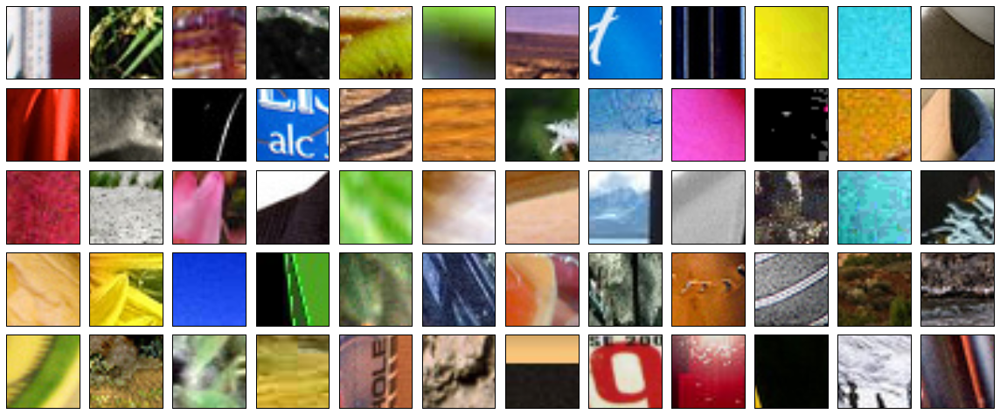

In [5]:

figure(figsize=(16,8))
nshow = 60
maxrow=12
for i in range(nshow):
    ax=subplot(nshow//maxrow + 1, maxrow,i+1)
    imshow(norm_range(impatches[:,:,:,i]))
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()

In [6]:
impatches.max()

256.0

** Figure 1: Sample image patches from the database. **

So, we are first going to turn all of our images into a matrix, just a sanity check to make shure the reshaping is done correctly.

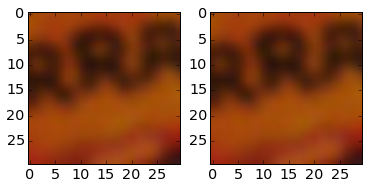

In [8]:
impatchr = impatches.copy().reshape((-1, impatches.shape[3]))

impatchr -= 1
impatchr /= 255



irec = impatchr[:, 170].reshape((impatches.shape[0], impatches.shape[1], impatches.shape[2]))

subplot(121)
imshow((impatches[:,:,:,170]-1)/255)
subplot(122)
imshow(irec)

Next, we do PCA-ICA anlaysis (this is actually the same as what I do with calcium imaging and vsd imaging) to get the basis vectors. We will use a set of `ncomponents=400` basis vectors. 

In [9]:
impatchr -= impatchr.mean()

In [10]:

ncomponents = 2000

pca_encoder = TruncatedSVD(ncomponents)
fica_encoder = FastICA(ncomponents)



In [11]:
tstart = time.time()
pca_encoder.fit(impatchr.T)
print 'Duration: ', time.time() - tstart


Duration:  328.439689875


In [12]:
scores = pca_encoder.transform(impatchr.T)

In [13]:
scores.shape

(100000, 2000)

scores is the image data in the pca basis space -- i.e. there are 10,000 images and 400 pc basis vectors. Lets look at the basis vectors.

In [14]:
pc_comp = pca_encoder.components_

print pc_comp.shape

pc_comp_ims = pc_comp.T.reshape((impatches.shape[0], impatches.shape[1], impatches.shape[2], -1))

(2000, 2700)


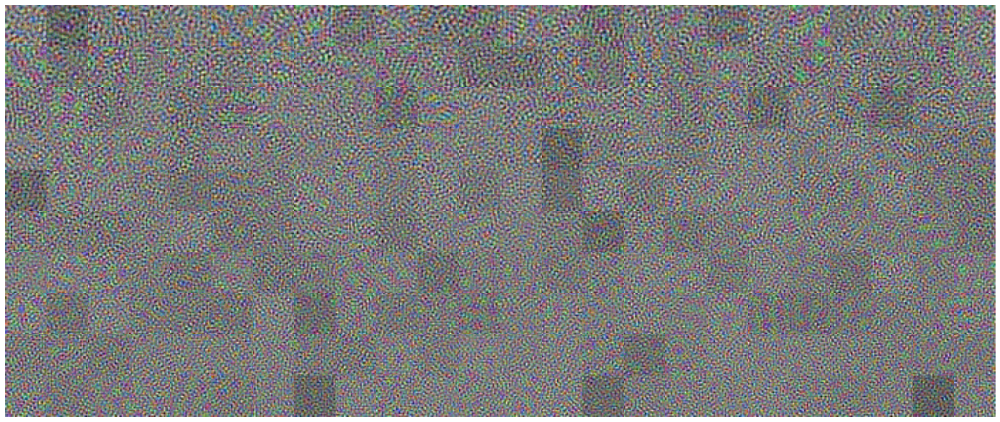

In [15]:
plt.rcParams['figure.subplot.hspace'] = 0
plt.rcParams['figure.subplot.wspace'] = 0

figure(figsize=(24,10))

nshow = 240
maxrow = 24
for i in range(nshow):
    ax=subplot(nshow//maxrow,maxrow,i+1)
    imshow(norm_range(pc_comp_ims[:,:,:,i+200]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)


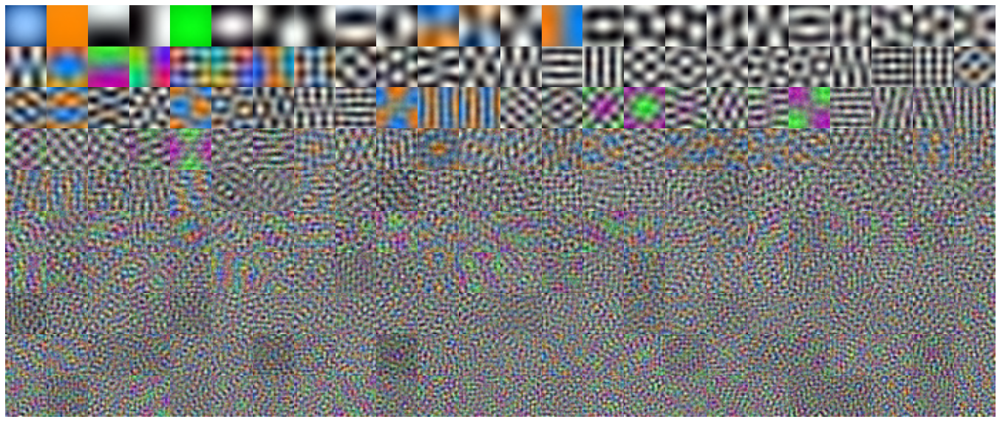

In [16]:
plt.rcParams['figure.subplot.hspace'] = 0
plt.rcParams['figure.subplot.wspace'] = 0

figure(figsize=(24,10))

nshow = 240
maxrow = 24
for i in range(nshow):
    ax=subplot(nshow//maxrow,maxrow,i+1)
    imshow(norm_range(pc_comp_ims[:,:,:,i+0]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)


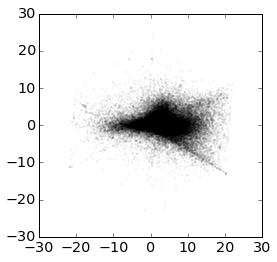

In [17]:
figure(figsize=(4,4))
plot(scores[:,1], scores[:,4], 'o', ms=0.1)

In [25]:
score_im, xedges, yedges = np.histogram2d(scores[:,1], scores[:,4], 501)


<matplotlib.colorbar.Colorbar instance at 0x7fbd7b177f80>

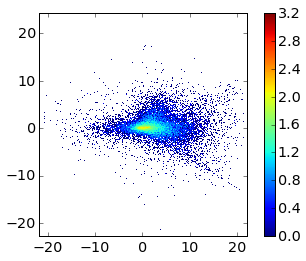

In [34]:
imshow(log10(score_im.T), interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
colorbar()

In [37]:
from sklearn.decomposition import dict_learning

X = scores[1::10, [1,4]]

print X.shape

(10000, 2)


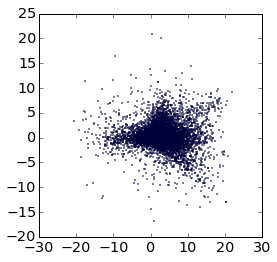

In [38]:
figure(figsize=(4,4))
plot(X[:,0], X[:,1], 'o', ms=1)

In [39]:

cc1 = pc_comp_ims[:,:,:,1].mean(axis=1).mean(axis=0)
cc2 = pc_comp_ims[:,:,:,4].mean(axis=1).mean(axis=0)

print cc1, cc2

[ 0.0237679   0.00184759 -0.0232669 ] [-0.01450717  0.02713628 -0.0126646 ]


In [63]:
tstart = time.time()

dcode, dict_mat, errors = dict_learning(X, 4, 4)

print 'Duration: ', time.time() - tstart


Duration:  49.9495389462


In [69]:
Xn = X.copy()
Xn[:,0] = X[:,0] / std(X[:,0])
Xn[:,1] = X[:,1] / std(X[:,1])

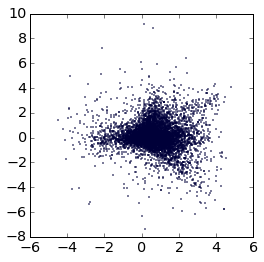

In [74]:
figure(figsize=(4,4))
plot(Xn[:,0], Xn[:,1], 'o', ms=1)

In [73]:
tstart = time.time()

dcode, dict_mat, errors = dict_learning(Xn, 4, 1)

print 'Duration: ', time.time() - tstart


Duration:  63.5595548153


In [75]:
from scipy.stats import skew

d_skew = skew(dcode, axis=0, bias=False)
d_mean = mean(dcode, axis=0)


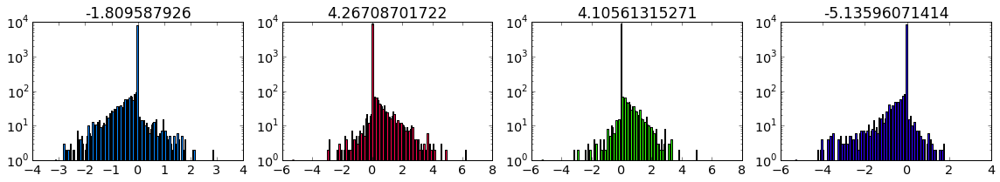

In [76]:
figure(figsize=(16,3))
for i in range(dcode.shape[1]):
    dcol = norm_range(cc1 * dict_mat[i,0] + cc2 * dict_mat[i, 1])

    subplot(1,4,i+1)
    hist(dcode[:,i], 151, color=dcol);
    title(d_skew[i])

    yscale('log')
    
plt.tight_layout()


In [51]:
print d_skew
print d_mean

[-0.81183147 -3.39674208  3.23088732  3.44734337]
[-0.92731689 -0.18398871  0.46173371  0.60363847]


In [77]:
dict_mat[d_skew<-2,:] = -dict_mat[d_skew<-2,:]

In [45]:
dict_mat[1,:] = -dict_mat[1,:]

[ 0.         0.5229969  1.       ]
[ 1.          0.          0.29284654]
[ 0.17873448  1.          0.        ]
[ 0.81228723  1.          0.        ]


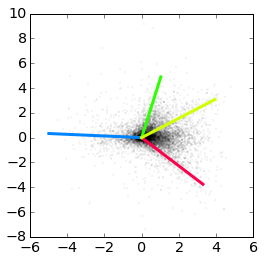

In [81]:
figure(figsize=(4,4))
#plot(scores[:,1], scores[:,4], 'o', ms=0.1)
plot(Xn[:,0], Xn[:,1], 'o', ms=0.1)

scale = 5


for i in range(dict_mat.shape[0]):
    dcol = norm_range(cc1 * dict_mat[i,0] + cc2 * dict_mat[i, 1])
    print dcol
    plot(scale * np.array([0, dict_mat[i,0]]), scale * np.array([0, dict_mat[i,1]]), color=dcol, lw=3)

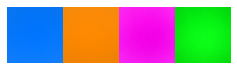

In [30]:
show_pm_pc = [1, 4]
figure(figsize=(4,1))

for ip, pc in enumerate(show_pm_pc):
    ax=subplot(1, 2 * len(show_pm_pc), 2*ip+1)
    imshow(norm_range(-pc_comp_ims[:,:,:,pc]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)
    
    ax=subplot(1, 2 * len(show_pm_pc), 2*ip+2)
    imshow(norm_range(pc_comp_ims[:,:,:,pc]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)


In [ ]:
figure()

In [25]:
nmf_encoder = NMF()

** Figure 2: Basis images of top PCA components**

So, to get a sparse basis, we perform ICA on the image data (we used the dimensionality-reduced image data). This will actually give us just a linear projection of the same set of basis vectors that the PCA analysis provides. This means that the reconstruction of the image from either the PCA or ICA basis vectors should be exactly the same. 

In [20]:
tstart = time.time()
which_pcs = np.arange(300)
fica_encoder.fit(scores[:,which_pcs])
print 'Duration: ', time.time() - tstart


n_components is too large: it will be set to 300
Duration:  255.102148056


In [21]:
ic_scores = fica_encoder.transform(scores[:1000,which_pcs])

In [22]:
pc_scores = scores[:ic_scores.shape[0], :ic_scores.shape[1]]


In [23]:
ic_scores.shape

(1000, 300)

In [24]:
ic_comp = fica_encoder.components_
ic_comp /= ic_comp.std(axis=0)
ic_comp = np.dot(ic_comp, pc_comp[which_pcs,:])
print ic_comp.shape

(300, 1200)


Here is what some of the ICA basis vectors look like. We get a bunch of cool Gabor filters and color opponency edges.

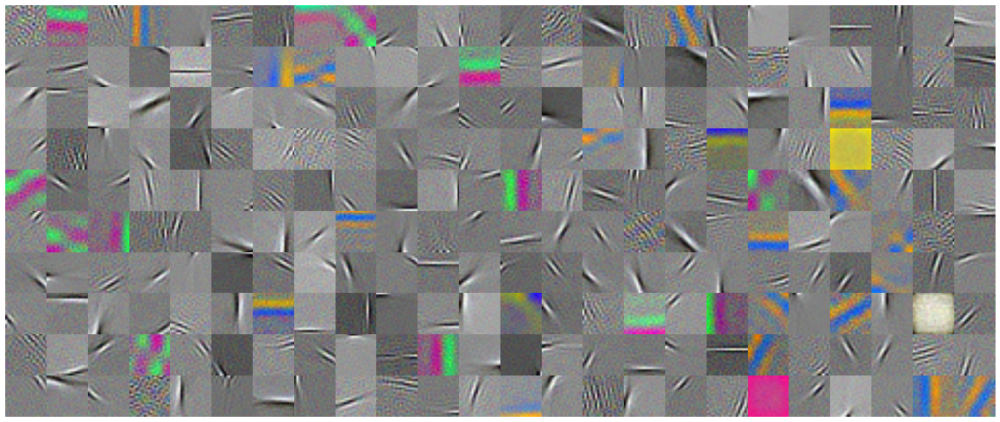

In [25]:
ic_comp_ims = ic_comp.T.reshape((impatches.shape[0], impatches.shape[1], impatches.shape[2], -1))
figure(figsize=(24,10))
nshow = 240
maxrow = 24
for i in range(nshow):
    ax=subplot(nshow//maxrow,maxrow,i+1)
    imshow(norm_range(ic_comp_ims[:,:,:,i+0]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)


** Figure 3: Sample of ICA basis vectors **

We can use these basis vectors to then represent an image. We just get a new random patch from the data base and use a linear regression (there are probably slightly better things than this, but not the point) of the image with the basis vectors to get a histogram of coefficients for each vector and that is the `pc_code` or `ic_code` that represents the image. Here is an image encoded into the basis and reconstructed, as well as the histogram of the coefficients (note we take out the mean of the image, which occasionally makes things look different because of renormalization).

In [40]:
nrecon = 16
impatch = imut.load_random_imnet_patches(nrecon, patch_size)
#impatch = impatches[:,:,:,58]
impatchr = impatch.reshape((-1, nrecon))
#impatchr -= impatchr.mean(axis=1)[:, np.newaxis]

ic_c = linalg.lstsq(ic_comp.T, impatchr)
pc_c = linalg.lstsq(pc_comp[which_pcs,:].T, impatchr)
ic_code = ic_c[0].T
pc_code = pc_c[0].T

0


In [41]:
ic_code.shape

(16, 300)

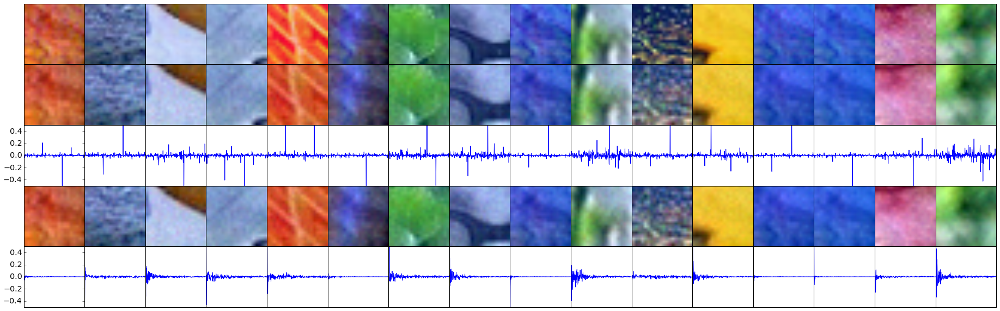

In [42]:


figure(figsize=(32, 10))

for imx in range(nrecon):
    
    ax = subplot(5, nrecon, imx + 1)
    imp = impatchr[:,imx].reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(imp))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(5, nrecon, imx + 1 + nrecon)
    ic_recon = np.dot(ic_code[imx,:], ic_comp)
    ic_reconr = ic_recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(ic_reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    
    ax = subplot(5, nrecon, imx + 1 + 2*nrecon)
    plot(ic_code[imx,:].T/norm(ic_code[imx, :]))
    ax.set_xticks([])
    ax.set_ylim([-0.5, 0.5])
    if imx > 0:
        ax.set_yticks([])

    ax = subplot(5, nrecon, imx + 1 + 3*nrecon)
    pc_recon = np.dot(pc_code[imx,:], pc_comp[which_pcs,:])
    pc_reconr = pc_recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(pc_reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(5, nrecon, imx + 1 + 4*nrecon)
    plot(pc_code[imx,:].T/norm(pc_code[imx, :]))
    ax.set_xticks([])
    ax.set_ylim([-0.5, 0.5])
    if imx > 0:
        ax.set_yticks([])


** Figure 4: PCA and ICA vector encoding of new image patches. ** Top row: original image. Second row: ICA basis reconstruction of the image. Third row: histogram of ICA basis coefficients. Fourth row: PCA basis reconstruction of image. Bottom row: histogram of PCA basis coefficients.



In [29]:
np.allclose(ic_recon, pc_recon)

True

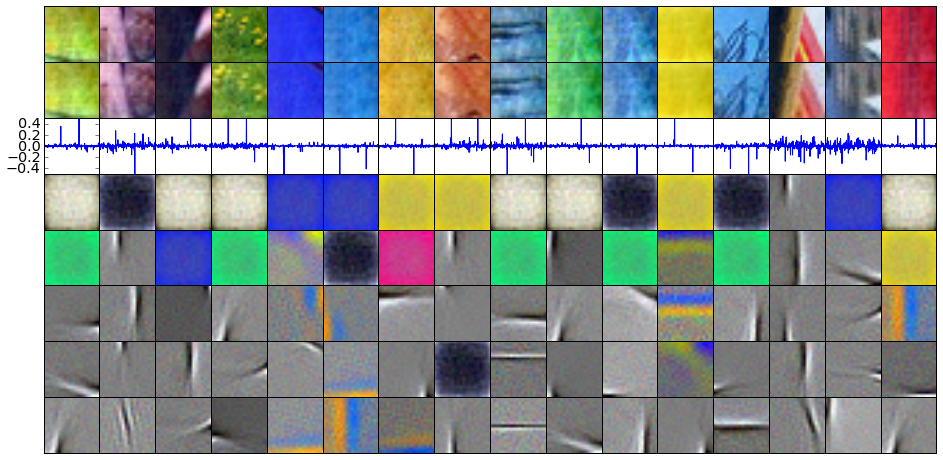

In [30]:
figure(figsize=(16, 8))

ic_ex = 2*arange(5)+1
nrows = 3 + len(ic_ex)
for imx in range(nrecon):
    
    ax = subplot(nrows, nrecon, imx + 1)
    imp = impatchr[:,imx].reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(imp))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(nrows, nrecon, imx + 1 + nrecon)
    ic_recon = np.dot(ic_code[imx,:], ic_comp)
    ic_reconr = ic_recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(ic_reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    
    ax = subplot(nrows, nrecon, imx + 1 + 2*nrecon)
    plot(ic_code[imx,:].T/norm(ic_code[imx, :]))
    ax.set_xticks([])
    ax.set_ylim([-0.5, 0.5])
    if imx > 0:
        ax.set_yticks([])

          
    idx_max = np.argsort(abs(ic_code[imx,:]))
  
    for ici,icx in enumerate(ic_ex):
        ax = subplot(nrows, nrecon, imx + 1 + (3+ici)*nrecon)
        ic_compr = ic_comp[idx_max[-icx],:].reshape(patch_size[0], patch_size[1], 3) 
        ic_compr = ic_compr * ic_code[imx, idx_max[-icx]] # this just flips it if its negative
        imshow(norm_range(ic_compr))
        ax.set_xticks([])
        ax.set_yticks([])
    


** Figure 5: Maximum ICA component visualization. ** Top three rows: same as Figure 4. Bottom rows: The component with the top coefficients that encodes the image and is displayed.

Pretty surprisingly, 7/10 of the images have the same largest ICA component (some are dark blueish some bright yellowish, because of negative sign). This seems to be one of the primary color/light-dark opponenecy components. 

Next, we encode the basis histograms into the hypervector, and we will encode a sequence of images using trajectory-association. 

In [32]:
N = int(1e5)
ic_hyperpatch = 2*(np.random.randn(len(which_pcs), N) < 0) - 1
pc_hyperpatch = 2*(np.random.randn(len(which_pcs), N) < 0) - 1

Mmax = 500
test_ims = imut.load_random_imnet_patches(Mmax, patch_size)

test_imr = test_ims.reshape((-1, Mmax))
test_imr = test_imr - test_imr.mean(axis=1)[:, np.newaxis]

ic_c = linalg.lstsq(ic_comp.T, test_imr)
pc_c = linalg.lstsq(pc_comp[which_pcs,:].T, test_imr)

ic_code = ic_c[0].T
pc_code = pc_c[0].T

print ic_code.shape

0 (500, 300)


In [33]:
K = 1

ic_hyperimage = np.zeros(N)
pc_hyperimage = np.zeros(N)

ic_decode = np.zeros_like(ic_code)
pc_decode = np.zeros_like(pc_code)

ic_decode1 = np.zeros_like(ic_code)
pc_decode1 = np.zeros_like(pc_code)

for imx in range(Mmax):
    ic_hypercode = np.dot(ic_code[imx, :] / norm(ic_code[imx,:]), ic_hyperpatch)
    pc_hypercode = np.dot(pc_code[imx, :] / norm(pc_code[imx,:]), pc_hyperpatch)
        
    ic_hyperimage = np.roll(ic_hyperimage, 1) + ic_hypercode
    pc_hyperimage = np.roll(pc_hyperimage, 1) + pc_hypercode
    
    ic_decode[imx, :] = np.dot(ic_hyperpatch, np.roll(ic_hyperimage, -K).T)
    pc_decode[imx, :] = np.dot(pc_hyperpatch, np.roll(pc_hyperimage, -K).T)

    ic_decode1[imx, :] = np.dot(ic_hyperpatch, np.roll(ic_hyperimage, -imx+K).T)
    pc_decode1[imx, :] = np.dot(pc_hyperpatch, np.roll(pc_hyperimage, -imx+K).T)
    

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:13: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:27: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


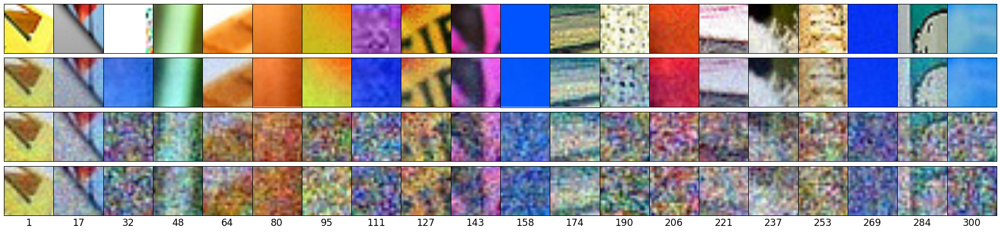

In [34]:

m_samp = np.round(linspace(1, 300, 20))

figure(figsize=(32,7))
for ix,imx in enumerate(m_samp):
    
    ax = subplot(4, len(m_samp), ix+1)
    imshow(norm_range(test_ims[:,:,:,imx]))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(4, len(m_samp), ix+1+len(m_samp))
    recon = np.dot(ic_code[imx,:], ic_comp)
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(4, len(m_samp), ix+1+2*len(m_samp))
    recon = np.dot(ic_decode[imx+K,:], ic_comp)
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(4, len(m_samp), ix+1+3*len(m_samp))
    recon = np.dot(pc_decode[imx+K,:], pc_comp[which_pcs,:])
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax.set_xlabel(str(int(imx)))

** Figure 6: Recall of the K=1 most recently stored image. ** Top row: original image. Middle row: direct reconstruction of image from component basis. Third row: decoded reconstruction of the image from hypervector with ICA basis. Bottom row: decoded reconstruction of the image of image from hypervector with PCA basis. Numbers at bottom indicate total number of images stored in the hypervector (minus 1). 

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:13: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:27: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


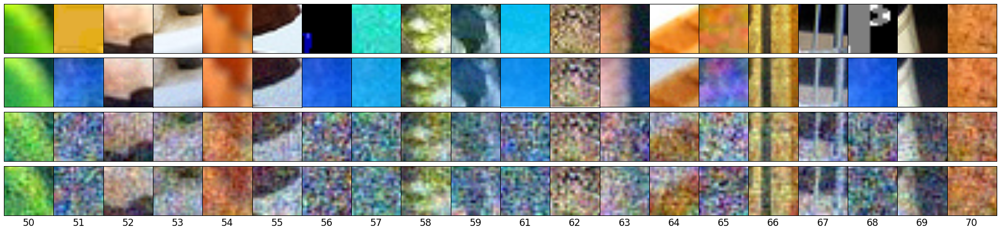

In [35]:

m_samp = np.round(linspace(50, 70, 20))

figure(figsize=(32,7))
for ix,imx in enumerate(m_samp):
    
    ax = subplot(4, len(m_samp), ix+1)
    imshow(norm_range(test_ims[:,:,:,imx]))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(4, len(m_samp), ix+1+len(m_samp))
    recon = np.dot(ic_code[imx,:], ic_comp)
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(4, len(m_samp), ix+1+2*len(m_samp))
    recon = np.dot(ic_decode[imx+K,:], ic_comp)/N
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(4, len(m_samp), ix+1+3*len(m_samp))
    recon = np.dot(pc_decode[imx+K,:], pc_comp[which_pcs,:])/N
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax.set_xlabel(str(int(imx)))

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


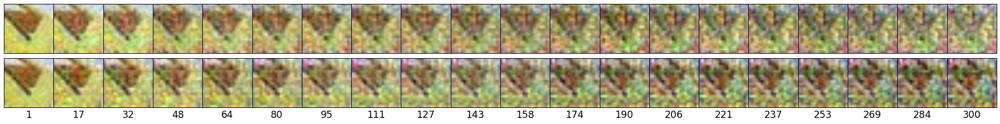

In [36]:

m_samp = np.round(linspace(1, 300, 20))

figure(figsize=(32,3.5))
for ix,imx in enumerate(m_samp):
    
    ax = subplot(2, len(m_samp), ix+1+0*len(m_samp))
    recon = np.dot(ic_decode1[imx+K,:], ic_comp)
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(2, len(m_samp), ix+1+1*len(m_samp))
    recon = np.dot(pc_decode1[imx+K,:], pc_comp[which_pcs,:])
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax.set_xlabel(str(int(imx)))

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


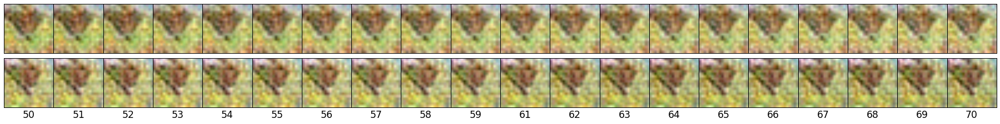

In [37]:

m_samp = np.round(linspace(50, 70, 20))

figure(figsize=(32,3.5))
for ix,imx in enumerate(m_samp):
    
    ax = subplot(2, len(m_samp), ix+1+0*len(m_samp))
    recon = np.dot(ic_decode1[imx+K,:], ic_comp)
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax = subplot(2, len(m_samp), ix+1+1*len(m_samp))
    recon = np.dot(pc_decode1[imx+K,:], pc_comp[which_pcs,:])
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([])
    
    ax.set_xlabel(str(int(imx)))

** Figure 7: Recall of the second encoded image with increased images stored. ** Top row: decoded reconstruction of the image from hypervector with ICA basis. Bottom row: decoded reconstruction of the image of image from hypervector with PCA basis. Numbers at bottom indicate total number of images stored in the hypervector (minus 1). 



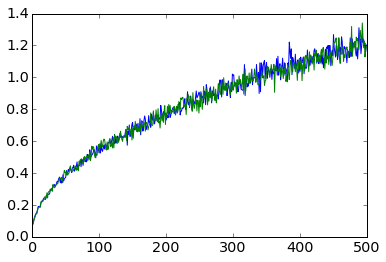

In [39]:
ic_ncode = ic_code / norm(ic_code, axis=1)[:, np.newaxis]
pc_ncode = pc_code / norm(pc_code, axis=1)[:, np.newaxis]

ic_error = np.sum((ic_ncode[0:(-K),:]-ic_decode[K:,:]/N)**2, axis=1)**0.5
pc_error = np.sum((pc_ncode[0:(-K),:]-pc_decode[K:,:]/N)**2, axis=1)**0.5

M = arange(len(ic_error)) + 1
plot(M, ic_error.T)
plot(M, pc_error.T)

In [4]:
def test_hyperimage_capacity(test_ims, N):

    K = 1

    ic_hyperpatch = 2*(np.random.randn(len(which_pcs), int(N)) < 0) - 1
    pc_hyperpatch = 2*(np.random.randn(len(which_pcs), int(N)) < 0) - 1

    Mmax = test_ims.shape[3]

    test_imr = test_ims.reshape((-1, Mmax))
    test_imr = test_imr - test_imr.mean(axis=1)[:, np.newaxis]

    ic_c = linalg.lstsq(ic_comp.T, test_imr)
    pc_c = linalg.lstsq(pc_comp[which_pcs,:].T, test_imr)

    ic_code = ic_c[0].T
    pc_code = pc_c[0].T

    ic_hyperimage = np.zeros(N)
    pc_hyperimage = np.zeros(N)

    ic_decode = np.zeros_like(ic_code)
    pc_decode = np.zeros_like(pc_code)

    ic_decode1 = np.zeros_like(ic_code)
    pc_decode1 = np.zeros_like(pc_code)

    for imx in range(Mmax):
        ic_hypercode = np.dot(ic_code[imx, :] / norm(ic_code[imx,:]), ic_hyperpatch)
        pc_hypercode = np.dot(pc_code[imx, :] / norm(pc_code[imx,:]), pc_hyperpatch)

        ic_hyperimage = np.roll(ic_hyperimage, 1) + ic_hypercode
        pc_hyperimage = np.roll(pc_hyperimage, 1) + pc_hypercode

        ic_decode[imx, :] = np.dot(ic_hyperpatch, np.roll(ic_hyperimage, -K).T)
        pc_decode[imx, :] = np.dot(pc_hyperpatch, np.roll(pc_hyperimage, -K).T)

        ic_decode1[imx, :] = np.dot(ic_hyperpatch, np.roll(ic_hyperimage, -imx+K).T)
        pc_decode1[imx, :] = np.dot(pc_hyperpatch, np.roll(pc_hyperimage, -imx+K).T)

    return ic_code, pc_code, ic_decode, pc_decode, ic_decode1, pc_decode1


In [3]:
test_N = [5e3, 1e4, 2e4, 4e4]

test_ims = imut.load_random_imnet_patches(1000, patch_size)

ic_code_all = []
pc_code_all = []
ic_decode_all = []
pc_decode_all = []
ic_decode1_all = []
pc_decode1_all = []

for iN, Nv in enumerate(test_N):
    print Nv,
    tstart = time.time()
    icc, pcc, icd, pcd, ic1, pc1 = test_hyperimage_capacity(test_ims, Nv)
    print 'Duration: ', time.time() - tstart
    
    ic_code_all.append(icc)
    pc_code_all.append(pcc)
    ic_decode_all.append(icd)
    pc_decode_all.append(pcd)
    ic_decode1_all.append(ic1)
    pc_decode1_all.append(pc1)
    
filename = 'data/hyperimage_capacity-nN=' + str(len(test_N)) + '-n' + + time.strftime('%y%m%d') + '.npz'
np.savez(filename, ic_code_all=ic_code_all, pc_code_all=pc_code_all, ic_decode_all=ic_decode_all, pc_decode_all=pc_decode_all,
        ic_decode1_all=ic_decode1_all, pc_decode1_all=pc_decode1_all, 
         test_N=test_N) #forgot these 
print filename

NameError: name 'patch_size' is not defined

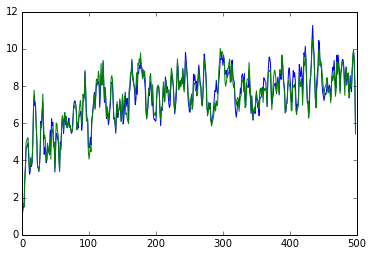

In [908]:
recon = np.dot(ic_code, ic_comp)

ic_recon = np.dot(ic_decode, ic_comp)
pc_recon = np.dot(pc_decode, pc_comp[which_pcs, :])

for i in arange(ic_recon.shape[0]):
    recon[i,:] = norm_range(recon[i,:])
    ic_recon[i,:] = norm_range(ic_recon[i,:])
    pc_recon[i,:] = norm_range(pc_recon[i,:])
    

ic_rerror = np.sum((recon[0:(-K),:]-ic_recon[K:,:])**2, axis=1)**0.5
pc_rerror = np.sum((recon[0:(-K),:]-pc_recon[K:,:])**2, axis=1)**0.5


smoothN = 5
plot(np.convolve(ic_rerror.T, np.ones(smoothN)/smoothN, mode='same'))
plot(np.convolve(pc_rerror.T, np.ones(smoothN)/smoothN, mode='same'))

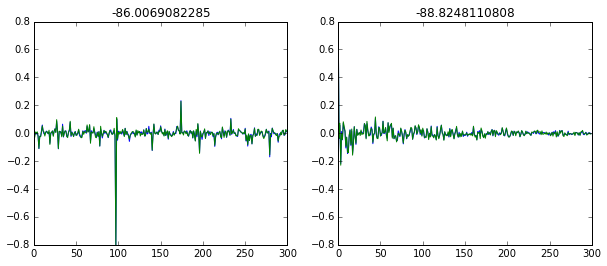

In [849]:
hist_idx = 4
figure(figsize=(10,4))
subplot(121)
plot(ic_ncode[hist_idx,:])
plot(ic_decode[hist_idx+K,:]/N)
title(np.sum(abs(ic_ncode[hist_idx,:]) * np.log2(abs(ic_ncode[hist_idx,:])/len(which_pcs))))

ylim([-0.8, 0.8])
subplot(122)
plot(pc_ncode[hist_idx,:])
plot(pc_decode[hist_idx+K,:]/N)
ylim([-0.8, 0.8])
title(np.sum(abs(pc_ncode[hist_idx,:]) * np.log2(abs(pc_ncode[hist_idx,:])/len(which_pcs))))

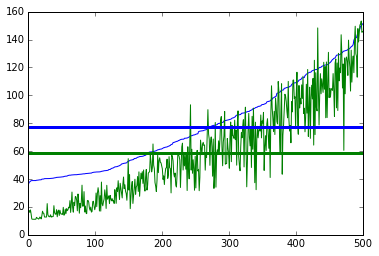

In [906]:
ic_code_info = np.zeros(ic_ncode.shape[0])
pc_code_info = np.zeros(pc_ncode.shape[0])

for i in range(ic_ncode.shape[0]):
    ic_code_info[i] = -np.sum(abs(ic_ncode[i,:]) * np.log2(abs(ic_ncode[i,:])/len(which_pcs)))
    pc_code_info[i] = -np.sum(abs(pc_ncode[i,:]) * np.log2(abs(pc_ncode[i,:])/len(which_pcs)))
       
sidx = np.argsort(ic_code_info)
plot(ic_code_info[sidx], 'b')
plot(pc_code_info[sidx], 'g')
plot([0, 500], 2*[np.mean(ic_code_info)], 'b', lw=3)
plot([0, 500], 2*[np.mean(pc_code_info)], 'g', lw=3)

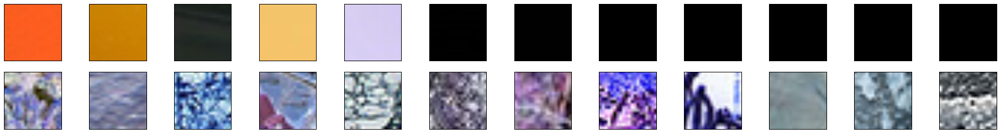

In [907]:
ntop = 12

figure(figsize=(32,4))

for i in range(ntop):
    ax=subplot(2,ntop,i+1)
    imshow(test_ims[:,:,:,sidx[i]])
    ax.set_xticks([])
    ax.set_yticks([])
    ax=subplot(2,ntop,i+ntop+1)
    imshow(test_ims[:,:,:,sidx[-i-1]])
    ax.set_xticks([])
    ax.set_yticks([])

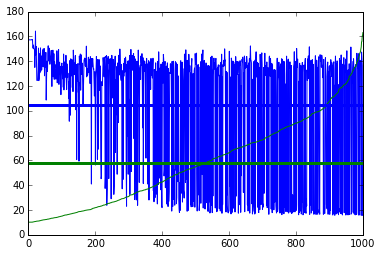

In [903]:
ic_scores_info = np.zeros(ic_scores.shape[0])
pc_scores_info = np.zeros(pc_scores.shape[0])

for i in range(ic_scores.shape[0]):
    ic_scores_info[i] = -np.sum(abs(ic_scores[i,:]/norm(ic_scores[i,:])) * np.log2(abs(ic_scores[i,:]/norm(ic_scores[i,:]))/len(which_pcs)))
    pc_scores_info[i] = -np.sum(abs(pc_scores[i,:]/norm(pc_scores[i,:])) * np.log2(abs(pc_scores[i,:]/norm(pc_scores[i,:]))/len(which_pcs)))
       
sidx = np.argsort(pc_scores_info)
plot(ic_scores_info[sidx], 'b')
plot(pc_scores_info[sidx], 'g')

#plot(ic_scores_info, 'b')
#plot(pc_scores_info, 'g')

plot([0, ic_scores.shape[0]], 2*[np.mean(ic_scores_info)], 'b', lw=3)
plot([0, pc_scores.shape[0]], 2*[np.mean(pc_scores_info)], 'g', lw=3)

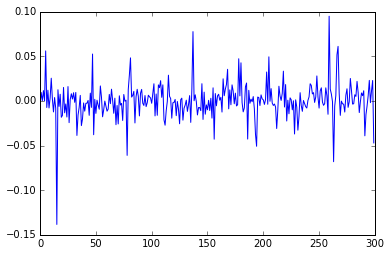

In [904]:
plot(ic_scores[100,:])

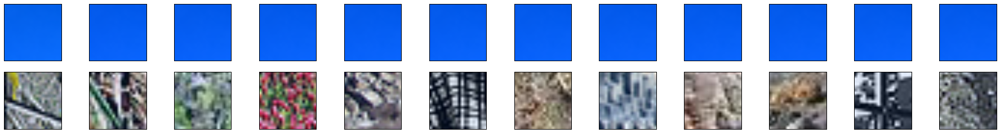

In [905]:
ntop = 12

figure(figsize=(32,4))

for i in range(ntop):
    ax=subplot(2,ntop,i+1)
    imshow(norm_range(impatches[:,:,:,sidx[i]]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax=subplot(2,ntop,i+ntop+1)
    imshow(norm_range(impatches[:,:,:,sidx[-i-1]]))
    ax.set_xticks([])
    ax.set_yticks([])

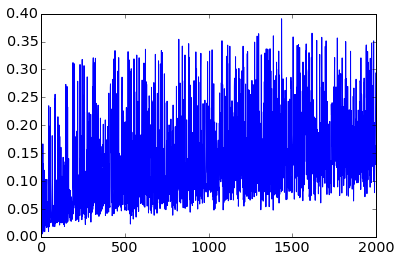

In [1010]:
recon = np.dot(ic_code, ic_comp)

ic_recon = np.dot(ic_decode, ic_comp)
#pc_recon = np.dot(pc_decode, pc_comp[which_pcs, :])

for i in arange(ic_recon.shape[0]):
    recon[i,:] = norm_range(recon[i,:])
    ic_recon[i,:] = norm_range(ic_recon[i,:])
    #pc_recon[i,:] = norm_range(pc_recon[i,:])
    

ic_rerror = np.mean((recon[0:(-K),:]-ic_recon[K:,:])**2, axis=1)**0.5
#pc_rerror = np.sum((recon[0:(-K),:]-pc_recon[K:,:])**2, axis=1)**0.5

plot(ic_rerror.T)
#plot(pc_rerror.T)

In [835]:
ic_recon.shape

(500, 1200)

In [998]:
test_ims.shape

(20, 20, 3, 2000)

In [999]:
filename = 'data/hyperimage_data-n' + time.strftime('%y%m%d') + '.npz'
print filename
np.savez(filename, ic_comp=ic_comp, pc_comp=pc_comp, which_pcs=which_pcs, patch_size=patch_size, test_ims=test_ims)
print 'done'

data/hyperimage_data-n160517.npz
done


/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:9: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


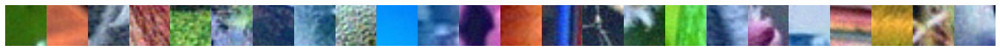

In [1002]:
ic_code = ic_code_all[0]
m_samp = np.round(linspace(1, 1200, 24))

f = figure(figsize=(24,1))
  
for ix,imx in enumerate(m_samp):   
    ax = subplot(1, len(m_samp), ix+1+0*len(m_samp))

    recon = np.dot(ic_code[imx,:], ic_comp)
    reconr = recon.reshape(patch_size[0], patch_size[1], 3)
    imshow(norm_range(reconr))
    ax.set_xticks([])
    ax.set_yticks([]) 
    ax.set_frame_on(False)

    
savefig('figures/image_orig-nN=6-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/image_orig-nN=6-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:11: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


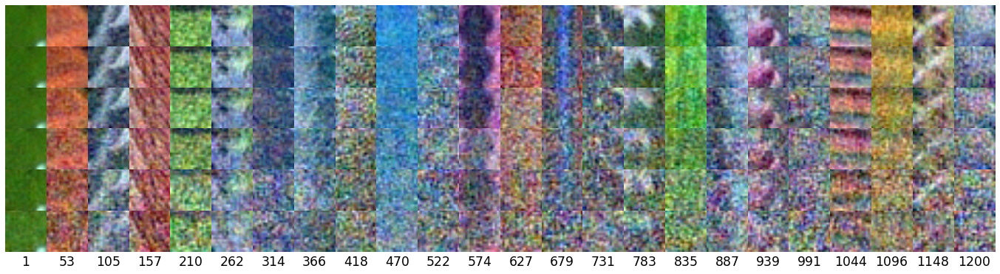

In [1000]:

m_samp = np.round(linspace(1, 1200, 24))

f = figure(figsize=(24,6))
  
for ix,imx in enumerate(m_samp):
    for iN in range(len(test_N)):

        ax = subplot(len(test_N), len(m_samp), ix+1+(iN)*len(m_samp))
        ic_decode = ic_decode_all[len(test_N) - iN - 1]
        recon = np.dot(ic_decode[imx+K,:], ic_comp)
        reconr = recon.reshape(patch_size[0], patch_size[1], 3)
        imshow(norm_range(reconr))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)


    ax.set_xlabel(str(int(imx)))
    

savefig('figures/image_recon-nN=6-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/image_recon-nN=6-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

/home/epaxon/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:11: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


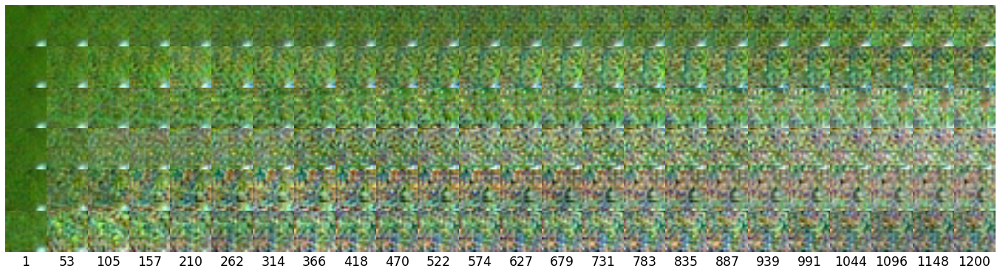

In [1017]:

m_samp = np.round(linspace(1, 1200, 24))

f = figure(figsize=(24,6))
  
for ix,imx in enumerate(m_samp):
    for iN in range(len(test_N)):

        ax = subplot(len(test_N), len(m_samp), ix+1+(iN)*len(m_samp))
        ic_decode = ic_decode1_all[len(test_N) - iN - 1]
        recon = np.dot(ic_decode[imx+K,:], ic_comp)
        reconr = recon.reshape(patch_size[0], patch_size[1], 3)
        imshow(norm_range(reconr))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)


    ax.set_xlabel(str(int(imx)))
    

savefig('figures/image_recon-d1-nN=6-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/image_recon-d1-nN=6-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

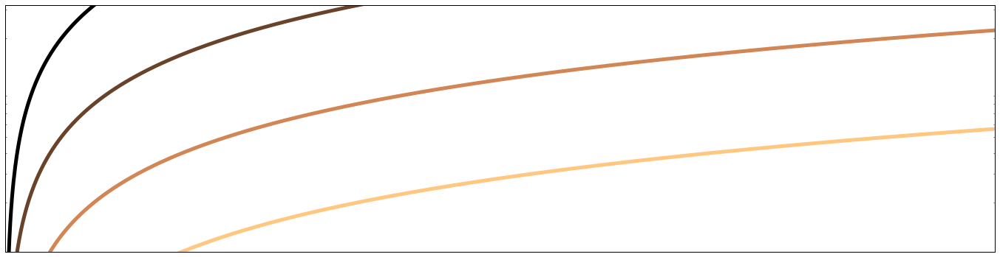

In [1006]:
figure(figsize=(24,6))

iso_error = [0.1, 0.2, 0.4, 0.8]
M = arange(1200)
D = ic_code.shape[1]  
cm = get_cmap('copper', len(iso_error))
for ix,error in enumerate(iso_error):
    N = D*(M-1)/error**2
    plot(M, N, lw=5, color=cm(ix))
    
yscale('log')
ylim([1e5, 32e5])
xticks([])
yticks([])

savefig('figures/iso_error_curves-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/iso_error_curves-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

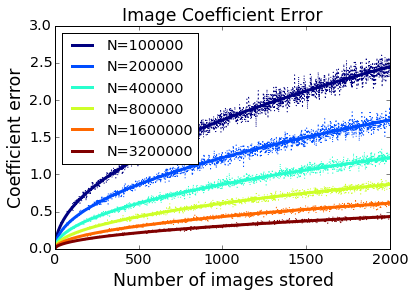

In [1015]:

ic_ncode = ic_code / norm(ic_code, axis=1)[:, np.newaxis]

cm=get_cmap('jet', len(test_N))

for iN in range(len(test_N)):
    ic_decode = ic_decode_all[iN]
    ic_error = np.sum((ic_ncode[0:(-K),:]-ic_decode[K:,:]/test_N[iN])**2, axis=1)**0.5

    M = arange(len(ic_error)) + 1
    plot(M, ic_error.T, ':', color=cm(iN))
    plot(M, np.sqrt(ic_decode.shape[1] * M / test_N[iN]), lw=3, color=cm(iN), label='N=%05d' % test_N[iN])
    
xlabel('Number of images stored')
ylabel('Coefficient error')
title('Image Coefficient Error')
legend(loc='upper left')

savefig('figures/coefficient_error_fit-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/coefficient_error_fit-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

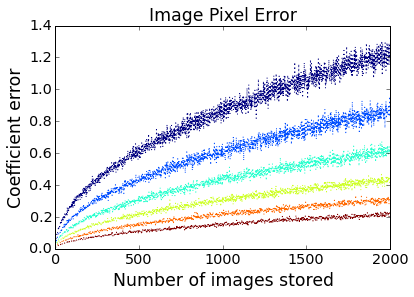

In [1014]:

ic_ncode = ic_code / norm(ic_code, axis=1)[:, np.newaxis]
recon = np.dot(ic_ncode, ic_comp)

cm=get_cmap('jet', len(test_N))

for iN in range(len(test_N)):
    ic_decode = ic_decode_all[iN]
    ic_recon = np.dot(ic_decode, ic_comp)
    
    ic_error = np.mean((recon[0:(-K),:]-ic_recon[K:,:]/test_N[iN])**2, axis=1)**0.5

    M = arange(len(ic_error)) + 1
    plot(M, ic_error.T, ':', color=cm(iN))
    
xlabel('Number of images stored')
ylabel('Coefficient error')
title('Image Pixel Error')
legend(loc='upper left')

savefig('figures/pixel_error-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/pixel_error-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

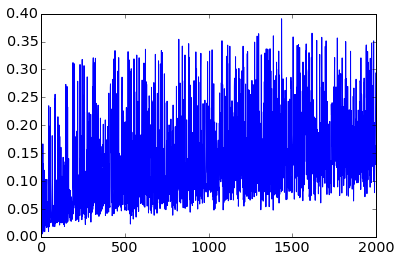

In [1010]:
recon = np.dot(ic_code, ic_comp)

ic_recon = np.dot(ic_decode, ic_comp)
#pc_recon = np.dot(pc_decode, pc_comp[which_pcs, :])

for i in arange(ic_recon.shape[0]):
    recon[i,:] = norm_range(recon[i,:])
    ic_recon[i,:] = norm_range(ic_recon[i,:])
    #pc_recon[i,:] = norm_range(pc_recon[i,:])
    

ic_rerror = np.mean((recon[0:(-K),:]-ic_recon[K:,:])**2, axis=1)**0.5
#pc_rerror = np.sum((recon[0:(-K),:]-pc_recon[K:,:])**2, axis=1)**0.5

plot(ic_rerror.T)
#plot(pc_rerror.T)

In [952]:
ic_error.shape

(499,)

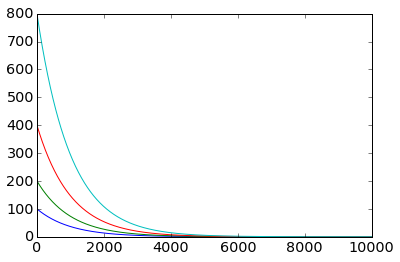

In [6]:
ll = 1 - 1e-3
t = linspace(1, 10000, 1000)
test_N = [1e5, 2e5, 4e5, 8e5]

for N in test_N:
    plot(t, ll**t * N * (1 - ll))


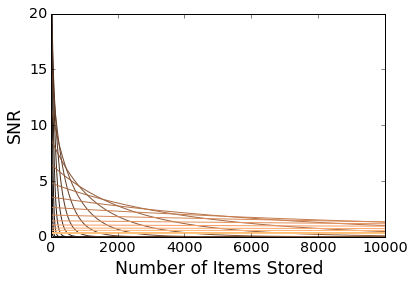

In [32]:
test_ll = 1 - np.logspace(-1, -6, 20)
t = linspace(1, 10000, 1000)
N = 1e5
cm = get_cmap('copper', len(test_ll))
for il,ll in enumerate(test_ll):
    plot(t, ll**t * np.sqrt(N * (1 - ll)), color=cm(il))
ylim([0, 20])
xlabel('Number of Items Stored')
ylabel('SNR')

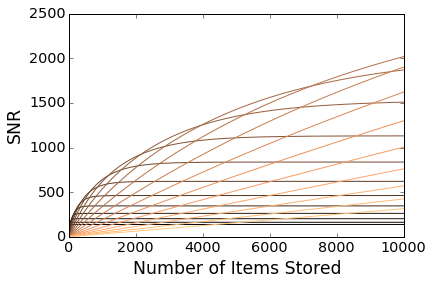

In [34]:
test_ll = 1 - np.logspace(-1, -6, 20)
t = linspace(1, 10000, 1000)
N = 1e5
cm = get_cmap('copper', len(test_ll))
for il,ll in enumerate(test_ll):
    plot(t, np.cumsum(ll**t * np.sqrt(N * (1 - ll))), color=cm(il))
#ylim([0, 20])
xlabel('Number of Items Stored')
ylabel('SNR')

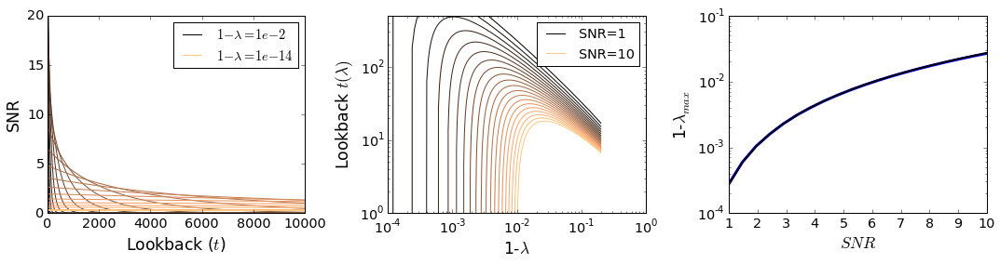

In [31]:

figure(figsize=(15,4))


subplot(131)

test_ll = 1 - np.logspace(-1, -6, 20)
t = linspace(1, 10000, 1000)
N = 1e5
cm = get_cmap('copper', len(test_ll))
for il,ll in enumerate(test_ll):
    
    if (il == 0) or (il==len(test_ll)-1):
        plot(t, ll**t * np.sqrt(N * (1 - ll)), color=cm(il), label=r'$1-\lambda=1e%0.0f$' % log(1-ll))
    else:        
        plot(t, ll**t * np.sqrt(N * (1 - ll)), color=cm(il))
    
    
ylim([0, 20])
xlabel('Lookback ($t$)')
ylabel('SNR')
legend(loc='upper right')


test_snr = linspace(1, 10, 20)

eps_max = np.zeros_like(test_snr)

N = 1e4

subplot(132)

cm = get_cmap('copper', len(test_snr))
for isnr,snr in enumerate(test_snr):
    eps = np.linspace(snr**2 / N, 0.2, 10000)
    
    #tt = np.log(N * snr / (eps)) / np.log(1-eps)
    tt = np.log(snr / np.sqrt(N*eps)) / np.log(1-eps)
    
    if (isnr == 0) or (isnr==len(test_snr)-1):
        plot(eps, tt, color=cm(isnr), label='SNR=%d' % snr)
    else:
        plot(eps, tt, color=cm(isnr))
    
    eps_max[isnr] = eps[argmax(tt)]

#ylim([0, 500])
xscale('log')
yscale('log')
ylim([1, 500])
xlabel('1-$\lambda$')
ylabel('Lookback $t(\lambda)$')
legend(loc='upper right')

subplot(133)
plot(test_snr, eps_max, lw=3)
plot(test_snr, test_snr**2 / N*exp(0.5)**2, 'k', lw=2)
yscale('log')
ylabel('1-$\lambda_{max}$')
xlabel('$SNR$')


plt.tight_layout()


savefig('figures/decay_net_curves-n' + time.strftime('%y%m%d') + '.png', format='png', transparent=True)
savefig('figures/decay_net_curves-n' + time.strftime('%y%m%d') + '.eps', format='eps', transparent=True)

In [79]:
exp(1)

2.7182818284590451

In [57]:
exp(1/0.1)

22026.465794806718

In [27]:
tt

array([ -1.46401604e+02,  -1.56180322e+02,  -1.66578809e+02,
        -1.77636208e+02,  -1.89394117e+02,  -2.01896747e+02,
        -2.15191085e+02,  -2.29327065e+02,  -2.44357760e+02,
        -2.60339571e+02,  -2.77332440e+02,  -2.95400072e+02,
        -3.14610169e+02,  -3.35034683e+02,  -3.56750080e+02,
        -3.79837623e+02,  -4.04383672e+02,  -4.30480007e+02,
        -4.58224163e+02,  -4.87719789e+02,  -5.19077037e+02,
        -5.52412962e+02,  -5.87851958e+02,  -6.25526217e+02,
        -6.65576212e+02,  -7.08151221e+02,  -7.53409876e+02,
        -8.01520742e+02,  -8.52662946e+02,  -9.07026833e+02,
        -9.64814666e+02,  -1.02624137e+03,  -1.09153533e+03,
        -1.16093923e+03,  -1.23471092e+03,  -1.31312442e+03,
        -1.39647086e+03,  -1.48505962e+03,  -1.57921939e+03,
        -1.67929946e+03,  -1.78567093e+03,  -1.89872812e+03,
        -2.01889001e+03,  -2.14660175e+03,  -2.28233632e+03,
        -2.42659628e+03,  -2.57991555e+03,  -2.74286146e+03,
        -2.91603674e+03,

In [11]:
test_ll

array([ 0.9       ,  0.90673967,  0.9130251 ,  0.91888692,  0.92435367,
        0.92945198,  0.93420668,  0.93864093,  0.94277632,  0.94663301,
        0.95022976,  0.95358411,  0.95671239,  0.95962983,  0.96235064,
        0.96488808,  0.96725451,  0.96946144,  0.97151964,  0.97343912,
        0.97522924,  0.9768987 ,  0.97845565,  0.97990767,  0.98126183,
        0.98252472,  0.98370249,  0.98480089,  0.98582526,  0.98678059,
        0.98767153,  0.98850243,  0.98927733,  0.99      ,  0.99067397,
        0.99130251,  0.99188869,  0.99243537,  0.9929452 ,  0.99342067,
        0.99386409,  0.99427763,  0.9946633 ,  0.99502298,  0.99535841,
        0.99567124,  0.99596298,  0.99623506,  0.99648881,  0.99672545,
        0.99694614,  0.99715196,  0.99734391,  0.99752292,  0.99768987,
        0.99784557,  0.99799077,  0.99812618,  0.99825247,  0.99837025,
        0.99848009,  0.99858253,  0.99867806,  0.99876715,  0.99885024,
        0.99892773,  0.999     ,  0.9990674 ,  0.99913025,  0.99